# Graphing training loss

In [18]:
import numpy as np
import csv
from matplotlib import pyplot as plt
%matplotlib inline

In [126]:

with open('traininglogs/f000_trainloss.ssv', newline='') as csvfile:
    spamreader = csv.reader(csvfile, delimiter=' ', quotechar='|')
    loss000 = np.array(tuple((int(epoch),float(loss)) for epoch,loss in spamreader))

with open('traininglogs/f050_trainloss.ssv', newline='') as csvfile:
    spamreader = csv.reader(csvfile, delimiter=' ', quotechar='|')
    loss050 = np.array(tuple((int(epoch),float(loss)) for epoch,loss in spamreader))

with open('traininglogs/f090_trainloss.ssv', newline='') as csvfile:
    spamreader = csv.reader(csvfile, delimiter=' ', quotechar='|')
    loss090 = np.array(tuple((int(epoch),float(loss)) for epoch,loss in spamreader))

with open('traininglogs/f100_trainloss.ssv', newline='') as csvfile:
    spamreader = csv.reader(csvfile, delimiter=' ', quotechar='|')
    loss100 = np.array(tuple((int(epoch),float(loss)) for epoch,loss in spamreader))


In [127]:
loss090 = loss090*(1,1)
loss100 = loss100*(1,10)


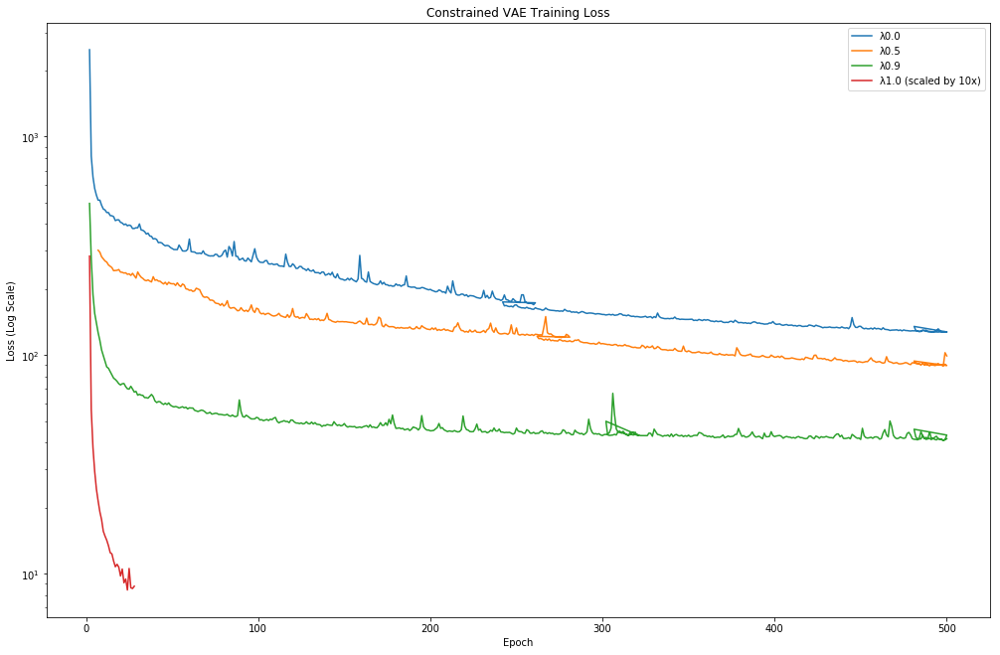

In [128]:
#plt.plot(splapmeedoo)
plt000 = plt.plot(loss000[:,0],loss000[:,1])
plt050 = plt.plot(loss050[:,0],loss050[:,1])
plt090 = plt.plot(loss090[:,0],loss090[:,1])
plt100 = plt.plot(loss100[:,0],loss100[:,1])
plt.yscale('log')
plt.ylabel('Loss (Log Scale)')
plt.xlabel('Epoch')
#plt.legend([plt000,plt050,plt090,plt100],["λ0.0","λ0.5","λ0.9","λ1.0"])
plt.legend(["λ0.0","λ0.5","λ0.9","λ1.0 (scaled by 10x)"])
plt.rcParams["figure.figsize"] = (17,11)
plt.title("Constrained VAE Training Loss")
plt.show()

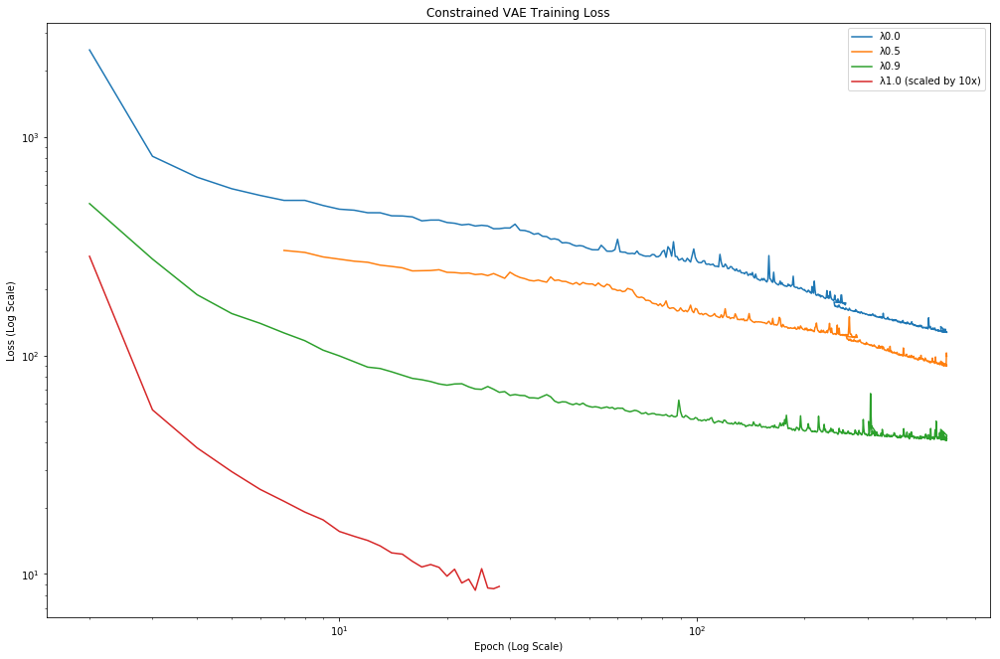

In [129]:
#plt.plot(splapmeedoo)
plt000 = plt.plot(loss000[:,0],loss000[:,1])
plt050 = plt.plot(loss050[:,0],loss050[:,1])
plt090 = plt.plot(loss090[:,0],loss090[:,1])
plt100 = plt.plot(loss100[:,0],loss100[:,1])
plt.yscale('log')
plt.xscale('log')
plt.ylabel('Loss (Log Scale)')
plt.xlabel('Epoch (Log Scale)')
#plt.legend([plt000,plt050,plt090,plt100],["λ0.0","λ0.5","λ0.9","λ1.0"])
plt.legend(["λ0.0","λ0.5","λ0.9","λ1.0 (scaled by 10x)"])
plt.rcParams["figure.figsize"] = (17,11)
plt.title("Constrained VAE Training Loss")
plt.show()

### Just for reference, what a log look like on log scales

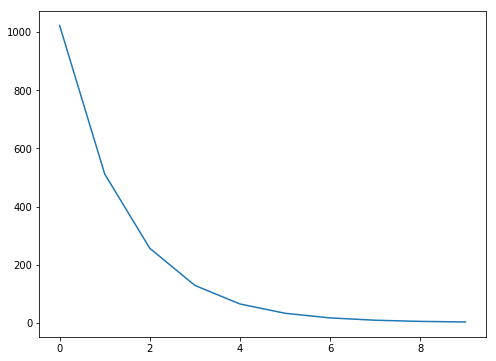

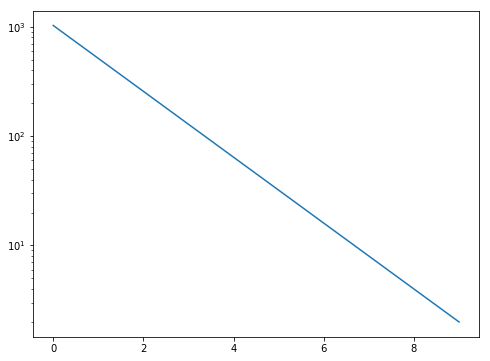

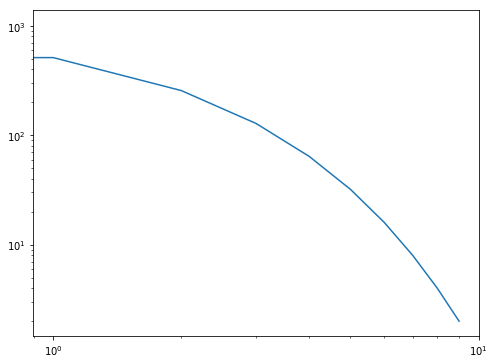

In [4]:

plt.rcParams["figure.figsize"] = (8,6)

logdat = tuple(2**(10-x) for x in range(0,10))
#logdat = tuple(2 for x in range(0,10))

plt.plot(logdat)
plt.show()

plt.plot(logdat)
plt.yscale('log')
plt.show()

plt.plot(logdat)
plt.xscale('log')
plt.yscale('log')
plt.show()


# Lets try UMAP

In [16]:
import umap

In [48]:
## generate some random high dim blobs so I know what I'm doing with UMAP
from random import random, choice
data = []
# this one is centered around 1.8 on first dim
for i in range(100):
    dat = [choice((-1,1))*random()**2+1.8]
    for i in range(10):
        dat+=[choice((-1,1))*random()**2]
    data+=[dat]
# this one is centered around 0 on all dim
for i in range(100):
    dat = [choice((-1,1))*random()**2]
    for i in range(10):
        dat+=[choice((-1,1))*random()**2]
    data+=[dat]


In [51]:
reducer = umap.UMAP(random_state=42)
mapper = reducer.fit_transform(data)
#umap.plot.points(mapper, labels=labels)

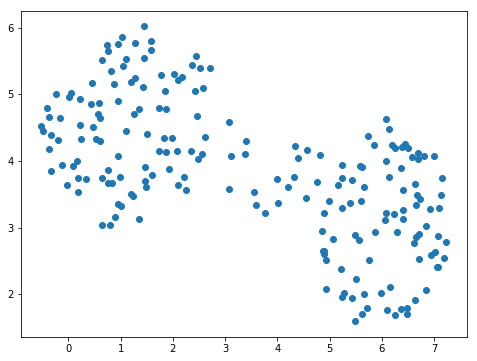

In [52]:
plt.scatter(
        mapper[:,0],
        mapper[:,1]
        )
plt.show()

# Ye old polation stuff

In [2]:
import torch
#from convvae import ConvVAE, loss_fn
import numpy as np

In [3]:
import fishvae

In [4]:
MVTEC_ROOT_DIR = "/scratch/ssd002/datasets/MVTec_AD"

In [5]:
from vector_cv_tools import transforms as VT
import albumentations as A
from albumentations.pytorch import ToTensorV2
from vector_cv_tools import datasets as vdatasets

In [6]:
import umap

In [7]:
import matplotlib.pyplot as plt
%matplotlib inline

In [8]:
def show_img_from_tensor(single_img):
    single_img = single_img.permute(1,2,0).cpu().numpy()
    plt.imshow(single_img)
    plt.axis("off")
    plt.show()

def evaluate_and_show(model, single_input):
    single_input = single_input.to("cuda")
    with torch.no_grad():
        recon, mu, logvar = model(single_input)
    loss = loss_fn(single_input, recon, mu , logvar)
    print("Loss is: ", loss.item())
    show_img_from_tensor(recon.squeeze(0))

In [9]:
#from matplotlib.pyplot import figure
#figure(num=None, figsize=(8, 6), dpi=80, facecolor='w', edgecolor='k')
#figure(figsize=(8, 6))
#fig.set_size_inches(18.5, 10.5)


In [10]:
def show_imgs(*imgs):
    plt.rcParams["figure.figsize"] = (3*len(imgs),3)
    for i in range(len(imgs)):
        plt.subplot(1,len(imgs),i+1)
        single_img = imgs[i].permute(1,2,0).cpu().numpy()
        plt.imshow(single_img)
    plt.show()

In [59]:
def img2vec(model,img):
    imgpu = img.unsqueeze(0).to("cuda")
    with torch.no_grad():
        z = model.module.encoder(imgpu)
    return z[..., :100] # we only like mu
def vec2img(model,vec):
    with torch.no_grad():
        img = model.module.decoder(vec.unsqueeze(-1).unsqueeze(-1))
        img = img.squeeze(0)
    return img

In [ ]:
fishmodel = torch.nn.DataParallel(fishvae.FishVAE())

In [49]:

#fishmodel.load_state_dict(torch.load("/checkpoint/ttrim/fishae/fishvae_v1_lmda0.0_epo480.pt")
#fishmodel.load_state_dict(torch.load("/checkpoint/ttrim/fishae/fishvae_v1_lmda0.0_epo500.pt"))
#fishmodel.load_state_dict(torch.load("/checkpoint/ttrim/fishae/fishvae_v1_lmda0.5_epo20.pt"))
#fishmodel.load_state_dict(torch.load("/checkpoint/ttrim/fishae/fishvae_v1_lmda0.5_epo500.pt"))
#fishmodel.load_state_dict(torch.load("/checkpoint/ttrim/fishae2/fishvae_v1_lmda0.9_epo1.pt"))
#fishmodel.load_state_dict(torch.load("/checkpoint/ttrim/fishae2/fishvae_v1_lmda0.9_epo2.pt"))
#fishmodel.load_state_dict(torch.load("/checkpoint/ttrim/fishae2/fishvae_v1_lmda0.9_epo5.pt"))
#fishmodel.load_state_dict(torch.load("/checkpoint/ttrim/fishae2/fishvae_v1_lmda0.9_epo8.pt"))
#fishmodel.load_state_dict(torch.load("/checkpoint/ttrim/fishae2/fishvae_v1_lmda0.9_epo13.pt"))
#fishmodel.load_state_dict(torch.load("/checkpoint/ttrim/fishae2/fishvae_v1_lmda0.9_epo20.pt"))
#fishmodel.load_state_dict(torch.load("/checkpoint/ttrim/fishae2/fishvae_v1_lmda0.9_epo40.pt"))
#fishmodel.load_state_dict(torch.load("/checkpoint/ttrim/fishae2/fishvae_v1_lmda0.9_epo200.pt"))
#fishmodel.load_state_dict(torch.load("/checkpoint/ttrim/fishae/fishvae_v1_lmda0.5_epo13.pt"))
#fishmodel.load_state_dict(torch.load("/checkpoint/ttrim/fishae/fishvae_v1_lmda0.5_epo40.pt"))
#fishmodel.load_state_dict(torch.load("/checkpoint/ttrim/fishae/fishvae_v1_lmda0.5_epo200.pt"))
fishmodel.load_state_dict(torch.load("/checkpoint/ttrim/fishae/fishvae_v1_lmda0.9_epo500.pt"))
#fishmodel.load_state_dict(torch.load("/checkpoint/ttrim/fishae2/fishvae_v1_lmda1_epo20.pt"))


fishmodel.module.eval()

FishVAE(
  (encoder): Encoder(
    (main): Sequential(
      (0): Conv2d(3, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): LeakyReLU(negative_slope=0.2, inplace=True)
      (2): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (4): LeakyReLU(negative_slope=0.2, inplace=True)
      (5): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (6): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (7): LeakyReLU(negative_slope=0.2, inplace=True)
      (8): Conv2d(512, 1024, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (9): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (10): LeakyReLU(negative_slope=0.2, inplace=True)
      (11): Conv2d(1024, 2048, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bi

In [60]:


steps = 20
startStep = -100
endStep = 120

#givenModel = models[3]
givenModel = fishmodel
#givenModel = model
modelName = "f100 epo:500"



In [18]:
basic_transform = VT.ComposeMVTecTransform([A.Resize(128, 128), A.ToFloat(max_value=255), ToTensorV2()])
test_dset = vdatasets.MVTec(MVTEC_ROOT_DIR, split="test", mask_only= True ,obj_types=["toothbrush"], transforms = basic_transform)
train_dset = vdatasets.MVTec(MVTEC_ROOT_DIR, split="train", transforms = basic_transform, obj_types=["toothbrush"])
other_dset = vdatasets.MVTec(MVTEC_ROOT_DIR, split="train", transforms = basic_transform)

In [20]:
# use model to get vec embeddings of images 0 to 1000
def get_emb(model):
    data = None
    from tqdm.notebook import tqdm #from tqdm import tqdm
    for i in tqdm(range(1000)):
        img = other_dset[i][0]
        vec = img2vec(model,img)
        if data is None:
            data = np.array([vec.squeeze().cpu().numpy()])
        else:
            data = np.append(data, [vec.squeeze().cpu().numpy()], axis=0)
    return(data)

In [64]:
data = get_emb(fishmodel)

100%|██████████| 1000/1000 [01:06<00:00, 14.94it/s]


In [25]:
epoch_names = (1,2,3,5,8,13,20,40,100,200,500)

In [65]:
emb_data = {"0.9":{"500":data}}

In [21]:
for i in epoch_names:
    print(i)
    try:
        fishmodel.load_state_dict(torch.load(f"/checkpoint/ttrim/fishae2/fishvae_v1_lmda0.9_epo{i}.pt"))
    except:
        fishmodel.load_state_dict(torch.load(f"/checkpoint/ttrim/fishae/fishvae_v1_lmda0.9_epo{i}.pt"))        
    emb_data["0.9"][str(i)] = get_emb(fishmodel)

1



2



3



5



8



13



20



40



100



200



500


In [22]:
emb_data["0.5"] = {}
emb_data["0.0"] = {}

In [23]:

for i in epoch_names:
    print(i)
    try:
        fishmodel.load_state_dict(torch.load(f"/checkpoint/ttrim/fishae2/fishvae_v1_lmda0.5_epo{i}.pt"))
    except:
        fishmodel.load_state_dict(torch.load(f"/checkpoint/ttrim/fishae/fishvae_v1_lmda0.5_epo{i}.pt"))        
    emb_data["0.5"][str(i)] = get_emb(fishmodel)

1



2



3



5



8



13



20



40



100



200



500


In [24]:
for i in epoch_names:
    print(i)
    try:
        fishmodel.load_state_dict(torch.load(f"/checkpoint/ttrim/fishae2/fishvae_v1_lmda0.0_epo{i}.pt"))
    except:
        fishmodel.load_state_dict(torch.load(f"/checkpoint/ttrim/fishae/fishvae_v1_lmda0.0_epo{i}.pt"))        
    emb_data["0.0"][str(i)] = get_emb(fishmodel)

1



2



3



5



8



13



20



40



100



200



500


In [20]:
data.shape

(1000, 100)

In [26]:
deviations = {}

In [28]:
for lmda in ("0.0","0.5","0.9"):
    devs = []
    for epo in epoch_names:
        std = np.std( emb_data[lmda][str(epo)], 0 )
        devs += [[int(epo), np.linalg.norm(std)]]
    deviations[lmda] = np.array(devs)

In [58]:
mean = np.mean(data, 0)
std = np.std(data,0)
np.linalg.norm(std) # euclidian "L2" distance

3.0683928

In [88]:
deviation = []
for epo in (1,2,3,5,8,13,20,40,100,200,500):
#for epo, datas in emb_data["0.9"].items():
    datas = emb_data["0.9"][str(epo)]
    std = np.std(datas,0)
    dev = np.linalg.norm(std)
    deviation += [[int(epo),float(dev)]]
deviation = np.array(deviation)
print(deviation)

[[  1.           2.68939757]
 [  2.           5.34338713]
 [  3.           7.04882765]
 [  5.           7.91444778]
 [  8.           8.31020355]
 [ 13.           6.94821882]
 [ 20.           6.10037708]
 [ 40.           5.30627537]
 [100.           3.84639573]
 [200.           3.06839275]
 [500.           2.39323282]]


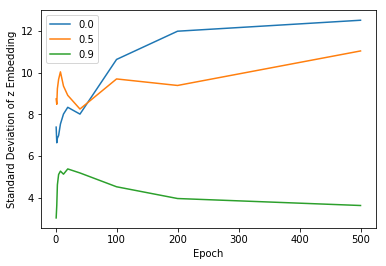

In [34]:
plts = []
for lmda in ("0.0","0.5","0.9"):
    plts += [
        plt.plot(deviations[lmda][:,0],
                          deviations[lmda][:,1],
                         )
    ]
plt.legend(["0.0","0.5","0.9"])
plt.ylabel('Standard Deviation of z Embedding')
plt.xlabel('Epoch')
plt.show()

In [21]:
import seaborn as sb

In [ ]:
other_dset[0][1]["label_names"]

namos = set()
for i in tqdm(range(1000)):
    namos.add( other_dset[i][1]["label_names"][0] )
print(namos)

###idk
c=[sns.color_palette()[x] for x in penguins.species_short.map({"Adelie":0, "Chinstrap":1, "Gentoo":2})])
###/idk


### Run once to generate colors.


In [23]:
#### Only run this once to generate color map
cols = []
for i in tqdm(range(1000)):
    x = {
            "capsule":0,
            "grid":1,
            "bottle":2,
            "carpet":3,
            "cable":4}[other_dset[i][1]["label_names"][0]]
    
    cols+=[sb.color_palette()[x]]
    

100%|██████████| 1000/1000 [00:55<00:00, 18.06it/s]


### ==================

In [42]:
##################### here it is!!!!!
# generate the embedding

#reducer = umap.UMAP(random_state=42)
#mapper = reducer.fit_transform(data)

trans = umap.UMAP(n_neighbors=15, random_state=42).fit(data)

####################################################### UMAAAAAAAAPPPPPPPPPPPPPPPPPPPP!!!!!!!!!!!!!!!!!

==================

In [50]:
%time trans_data = trans.transform(data)

CPU times: user 3.6 s, sys: 7.82 ms, total: 3.61 s
Wall time: 3.6 s


In [49]:
len(cols)


1000

In [31]:
def scatter(data):
    plt.rcParams["figure.figsize"] = (17,11)

    plt.scatter(
            data[:,0],
            data[:,1],
            c = cols,
            s = 0.3,
            )
    custom_lines = [plt.Line2D([0], [0], color=sb.color_palette()[x], lw=4) for x in range(5)]

    plt.legend(custom_lines,
               ["capsule",
                "grid",
                "bottle",
                "carpet",
                "cable"],
               loc="best",
               #bbox_to_anchor=(1.27, 1)
              )
    plt.title("f100 epo500 UMAP (1st 1000 samples)")
    plt.show()

### These plots with mapping fit to epo 500 data

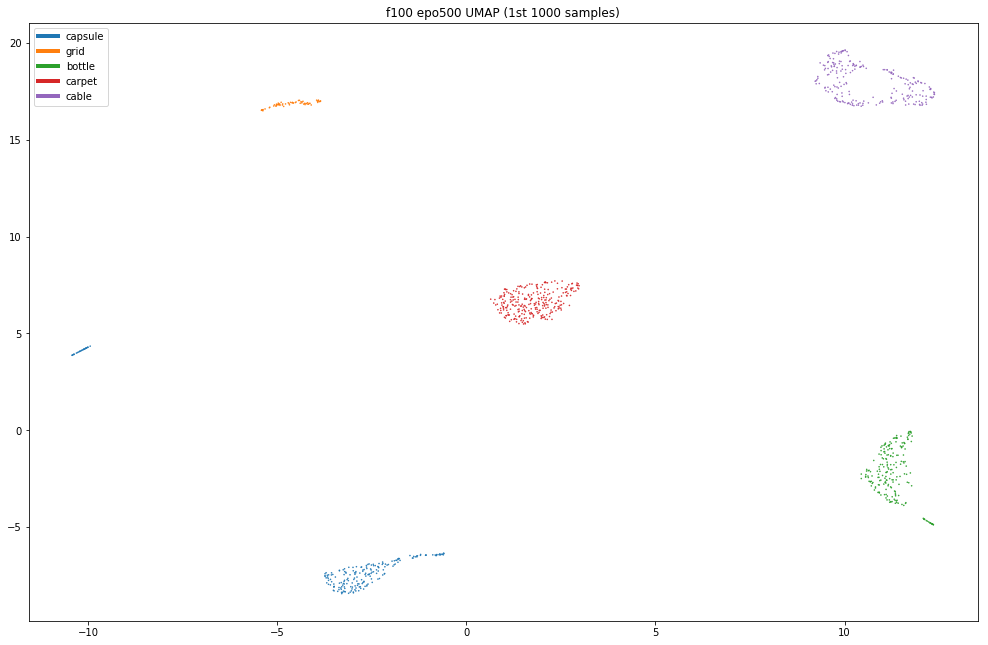

In [32]:
scatter(trans_data)# L90 e500

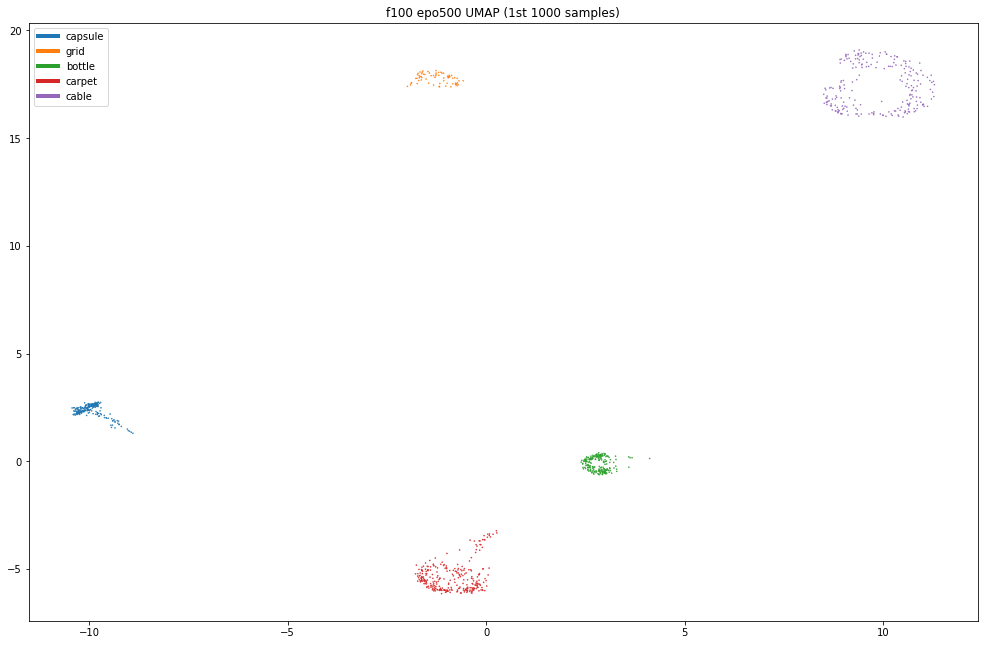

In [37]:
scatter(trans_data) # L90 e200

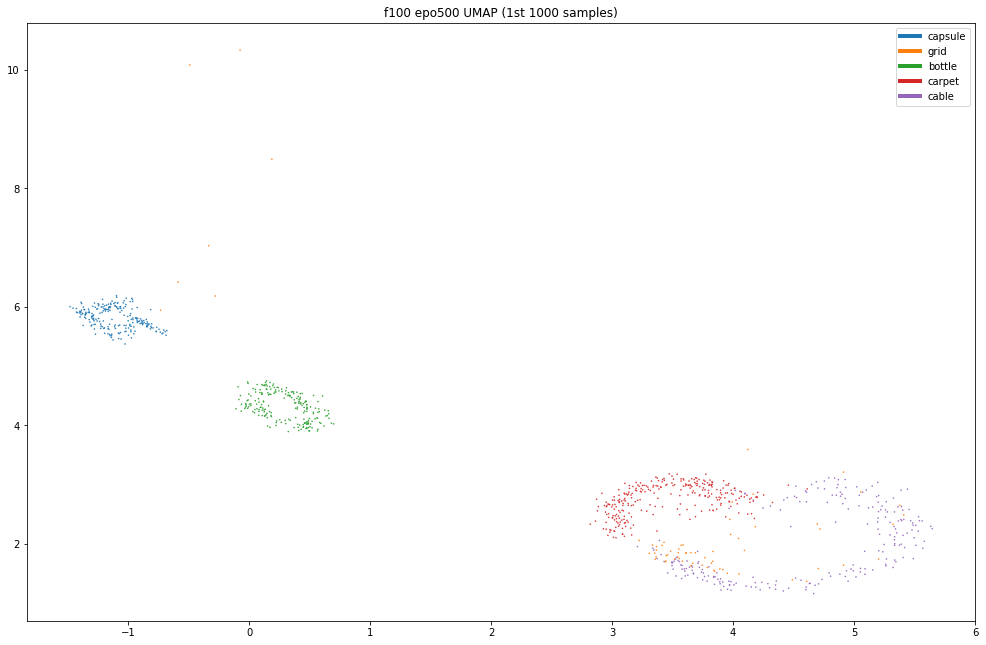

In [41]:
scatter(trans_data) # L90 e1

### These plots with mapping fit to epo 1 data

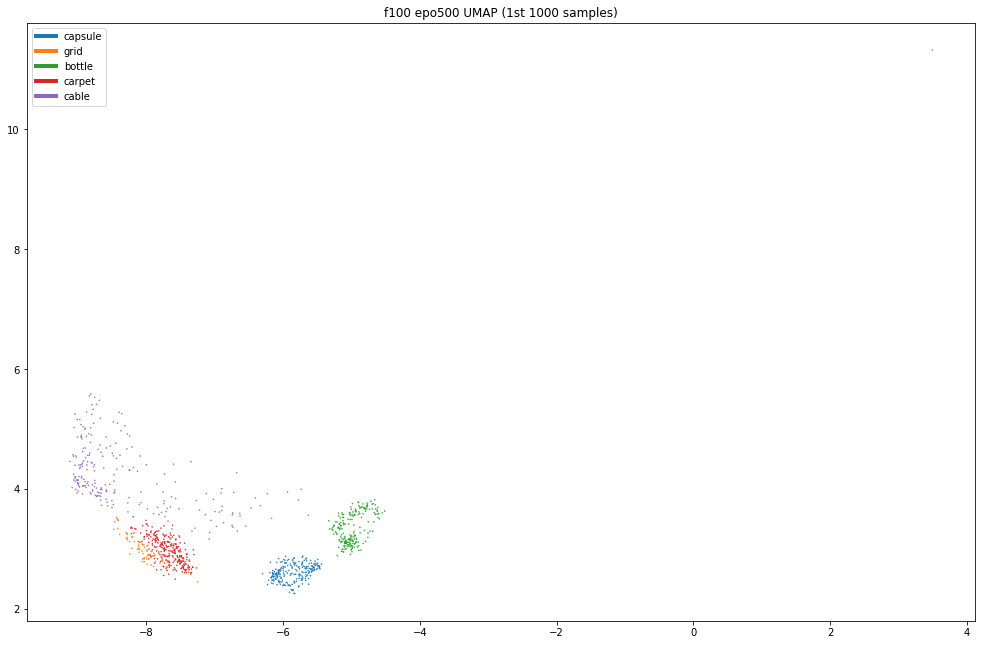

In [51]:
scatter(trans_data) # L90 e500

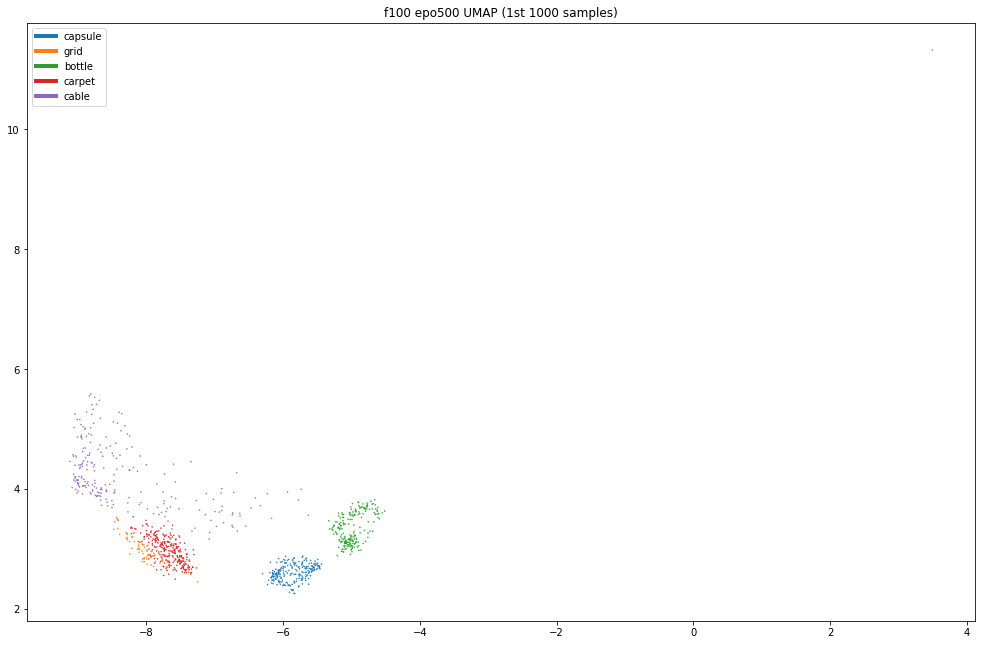

In [48]:
scatter(trans_data) # L90 e200

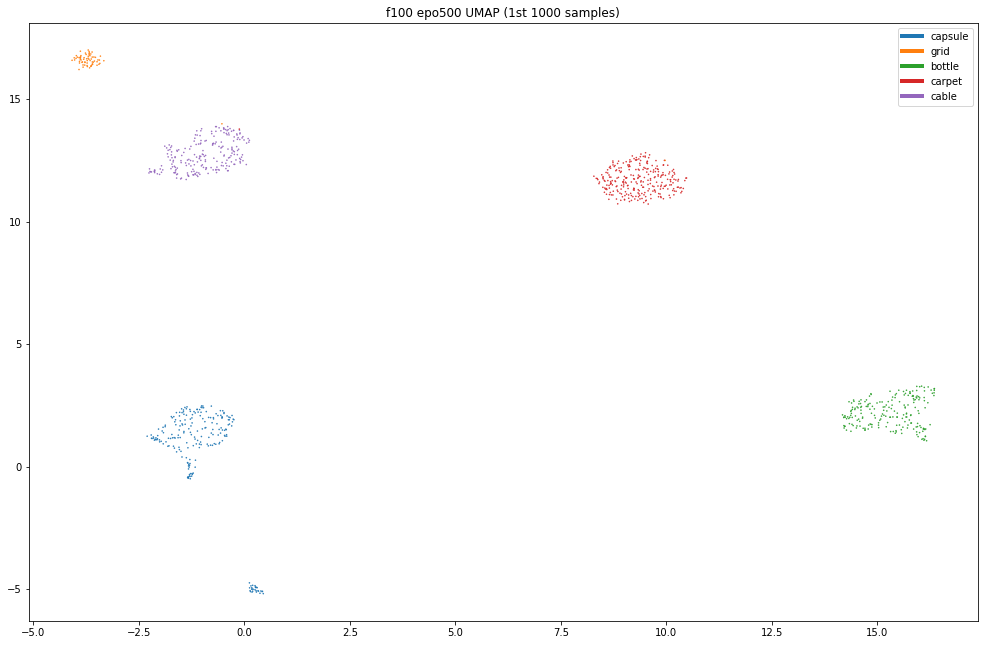

In [44]:
scatter(trans_data) # L90 e1

# only refrence cruft lives below this point & neat img diffing

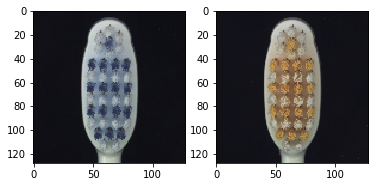

3629


In [64]:
imgA = train_dset[0][0]
imgB = train_dset[40][0]
show_imgs(imgA,imgB)
print(len(other_dset))

In [50]:
# screw rotation 90 degrees
imgA = other_dset[2578][0]
imgB = other_dset[2516][0]

In [69]:
# capsule to pill
imgA = other_dset[500][0]
imgB = other_dset[2100][0]

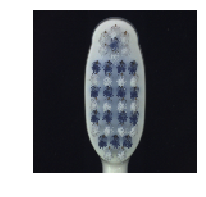

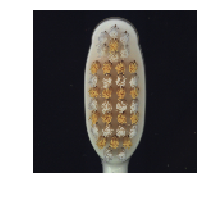

In [65]:
show_img_from_tensor(imgA)
show_img_from_tensor(imgB)

0


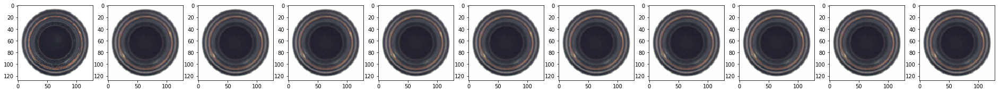

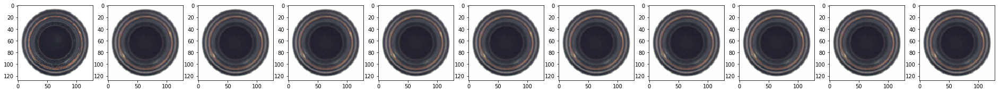

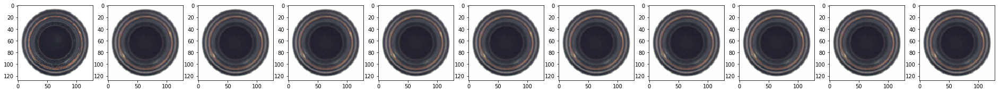

100


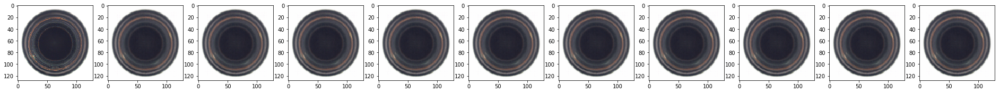

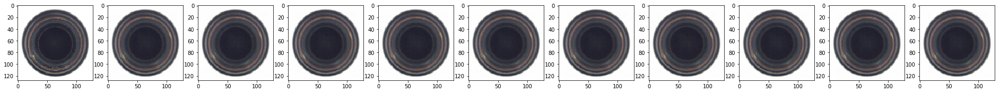

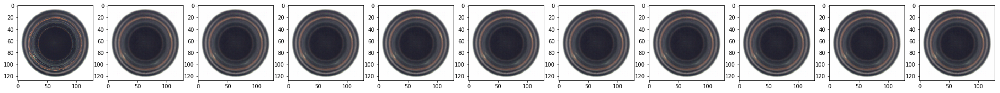

200


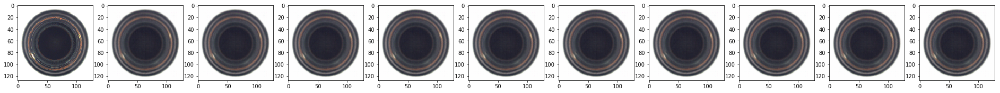

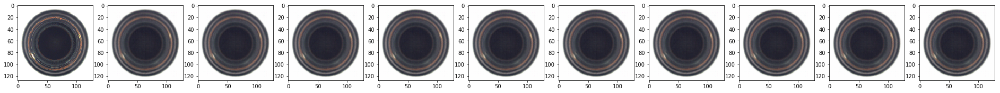

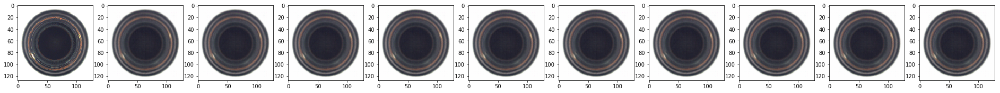

300


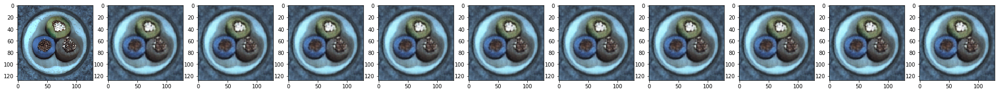

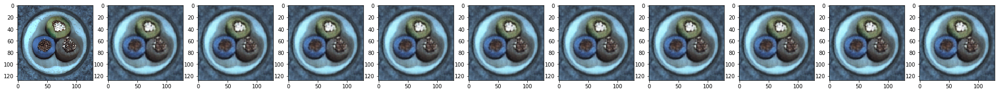

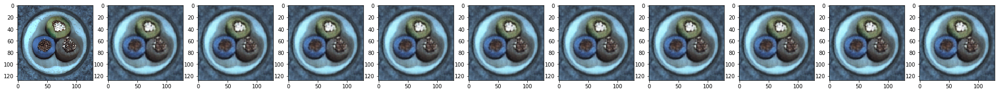

400


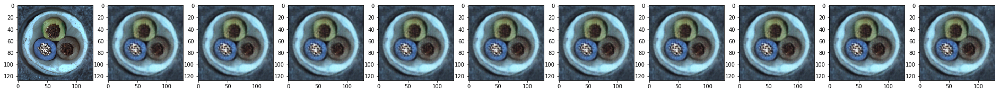

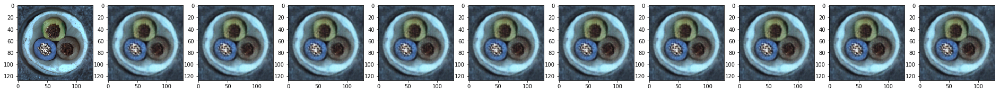

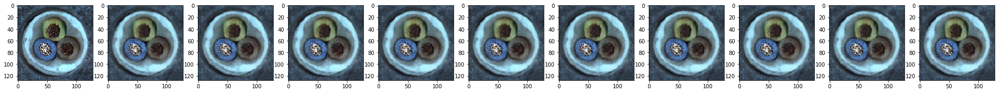

500


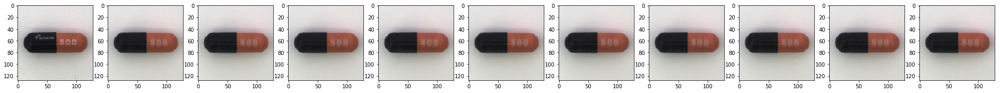

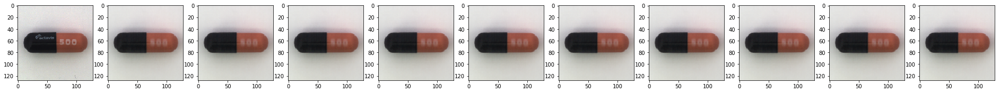

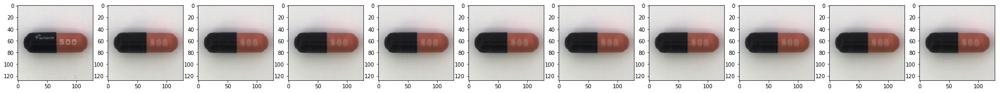

600


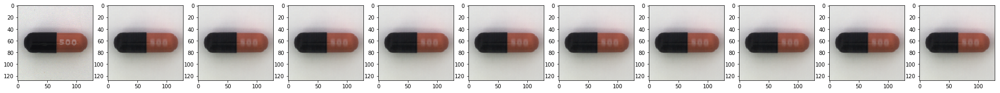

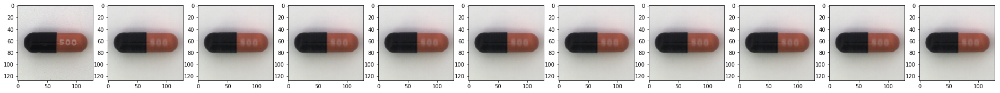

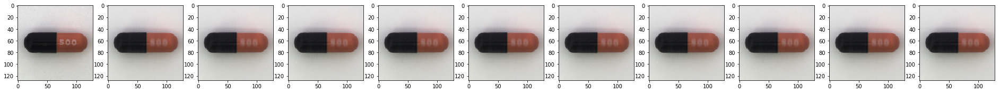

700


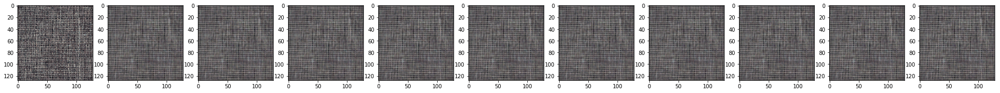

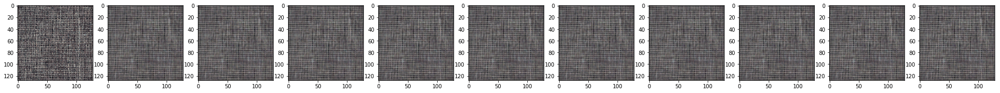

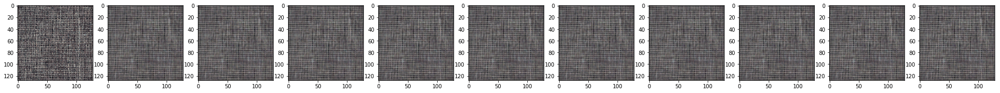

800


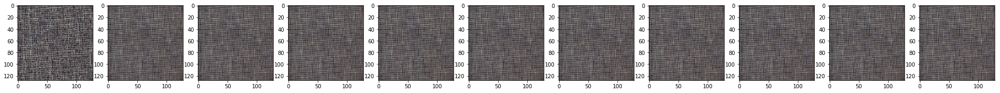

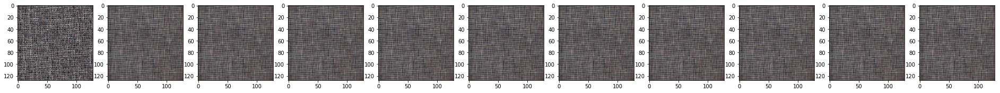

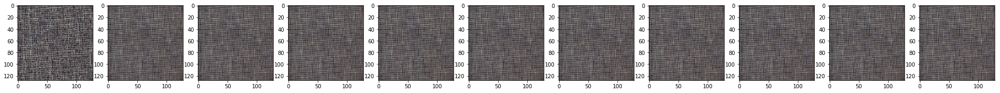

900


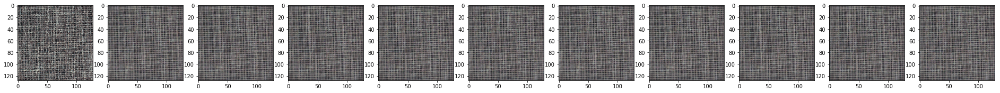

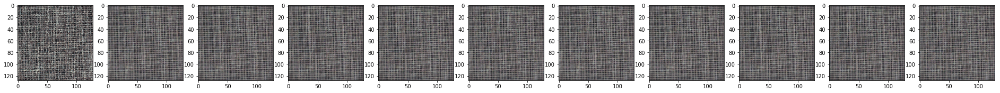

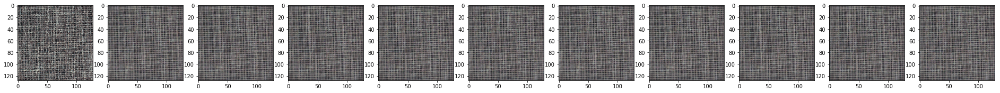

1000


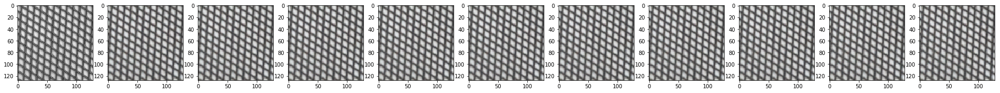

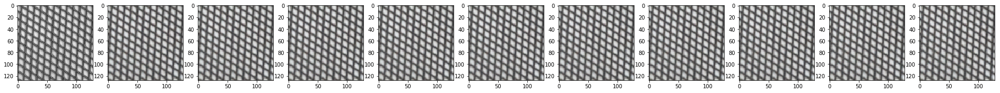

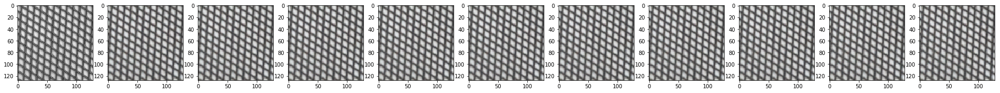

1100


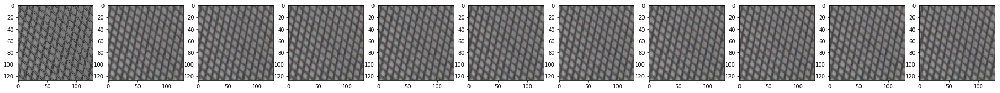

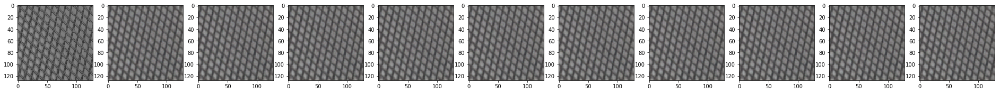

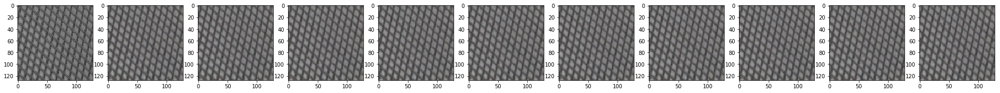

1200


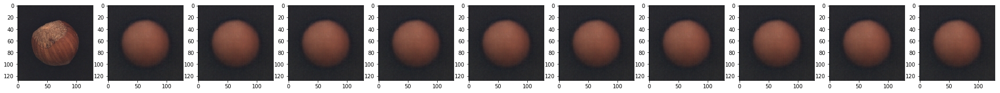

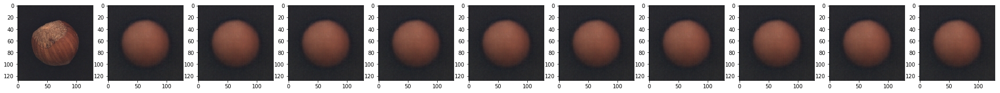

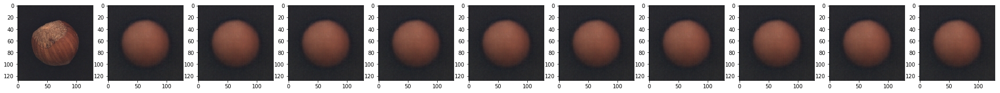

1300


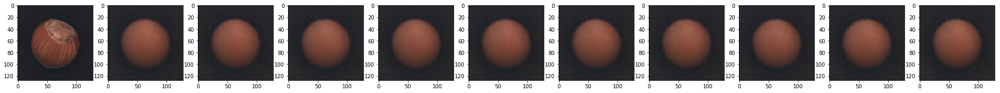

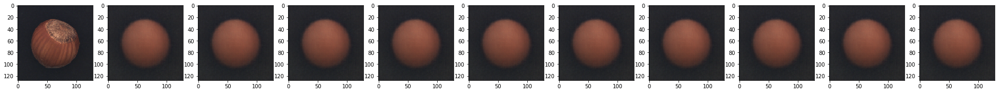

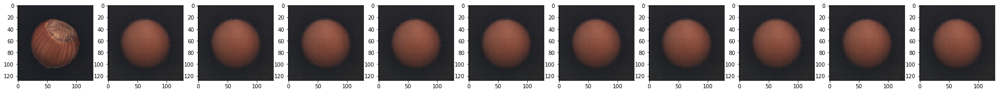

1400


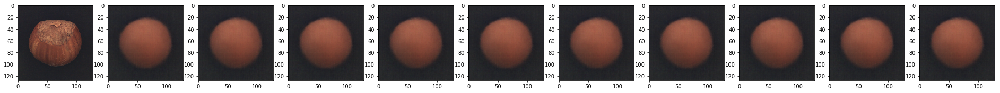

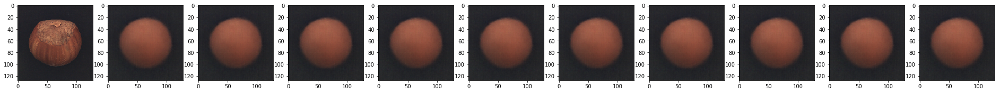

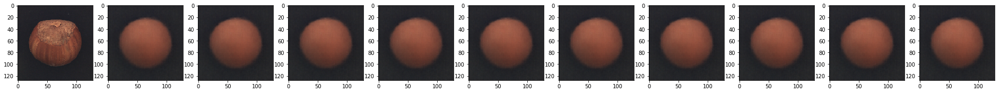

1500


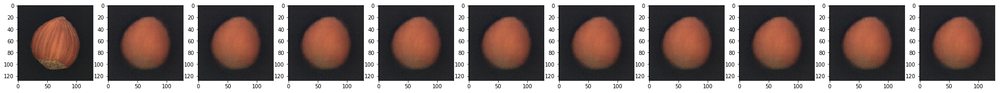

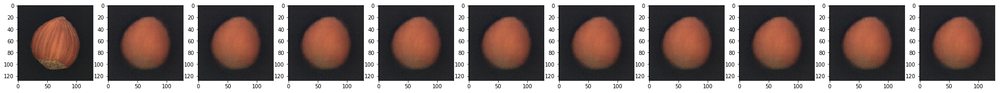

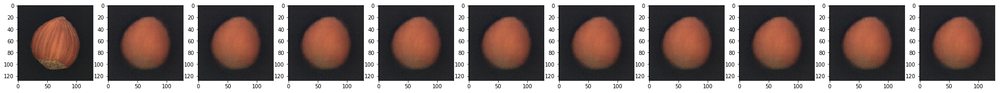

1600


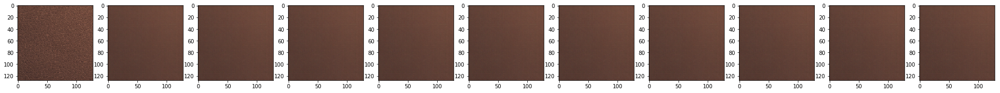

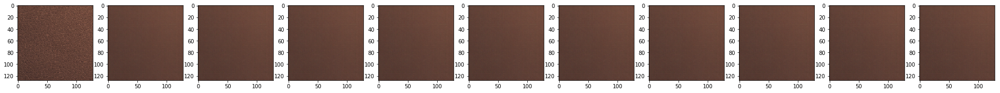

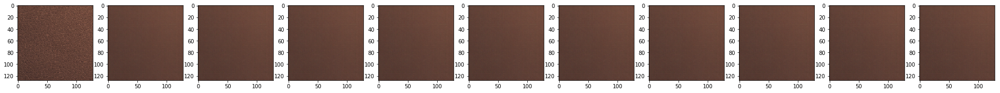

1700


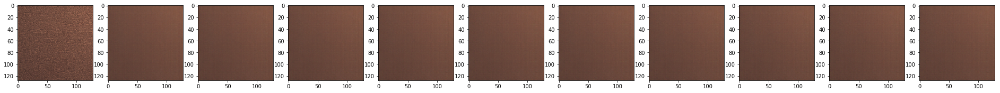

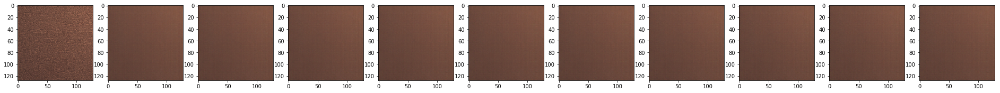

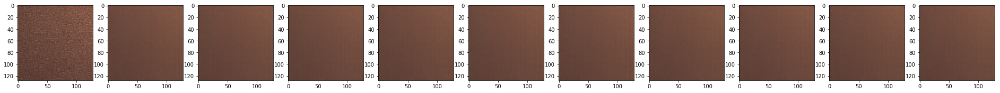

1800


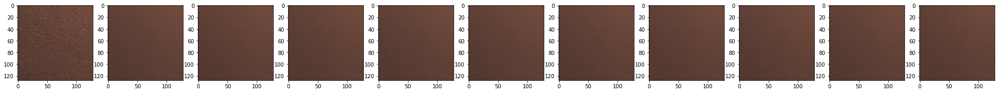

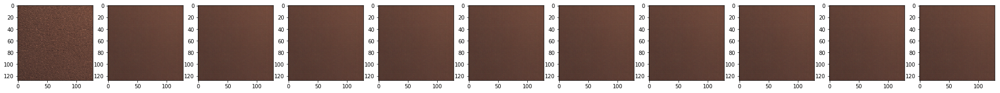

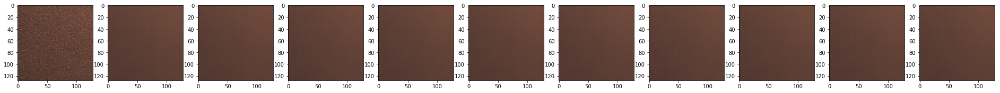

1900


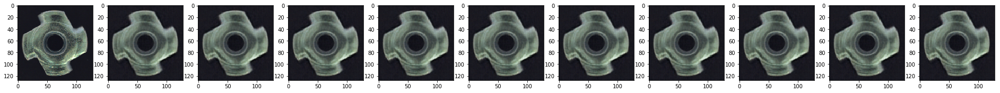

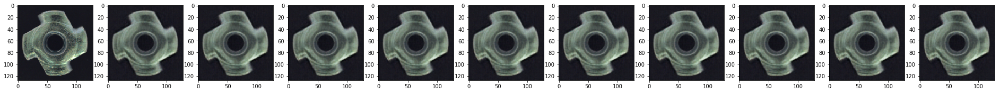

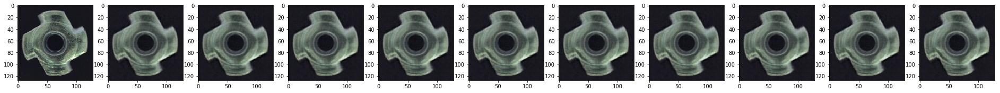

2000


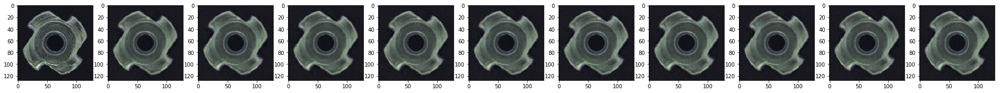

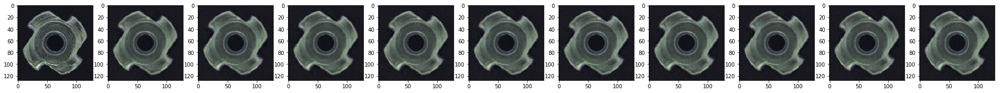

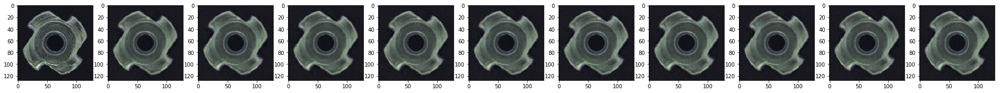

2100


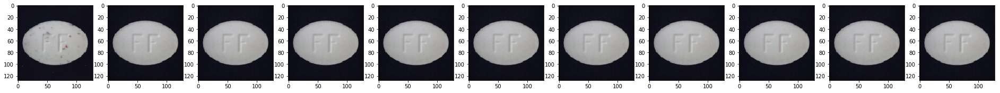

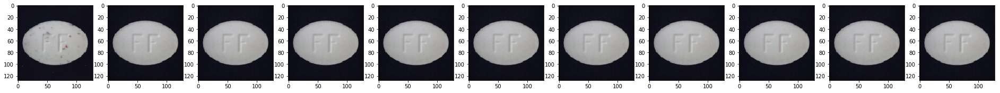

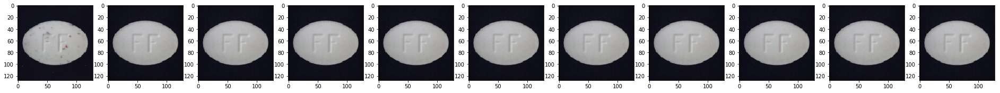

2200


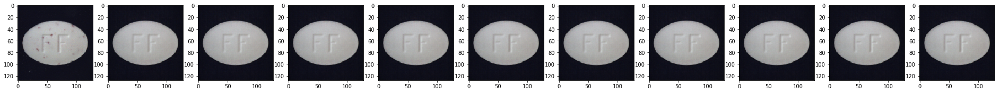

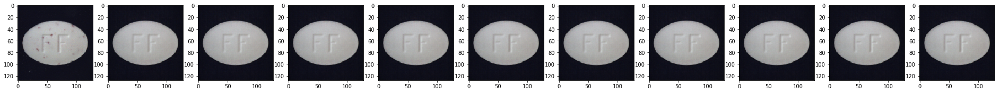

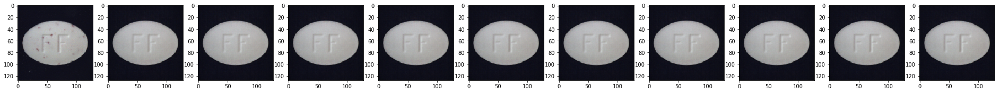

2300


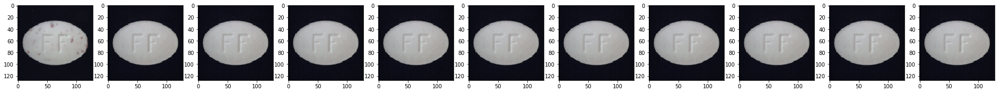

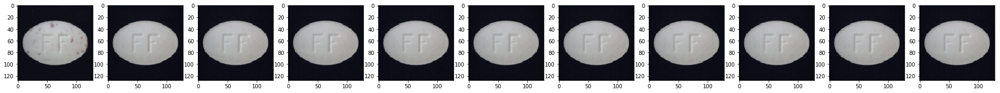

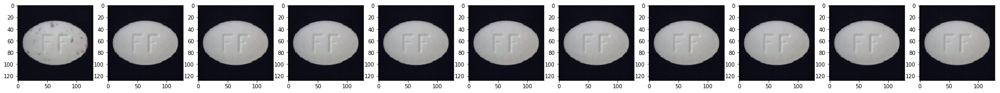

2400


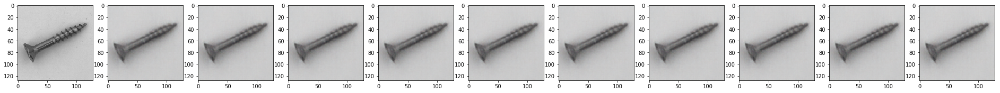

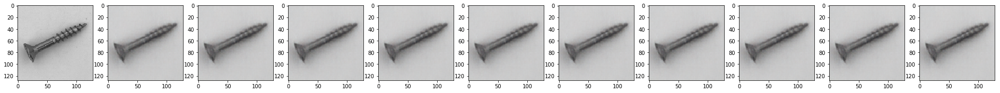

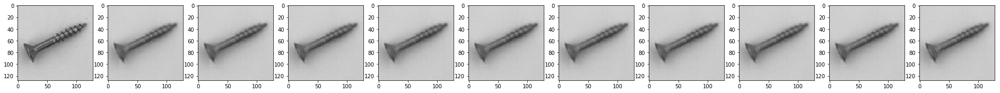

2500


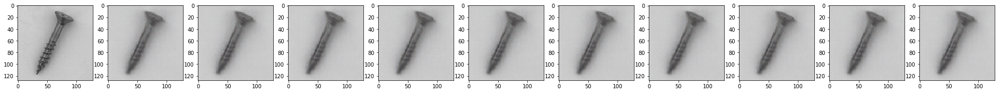

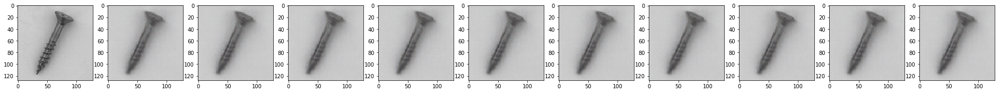

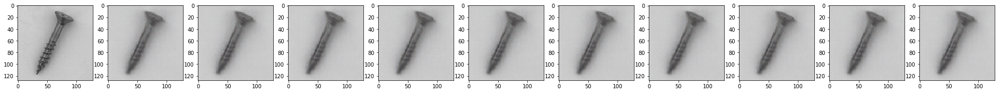

2600


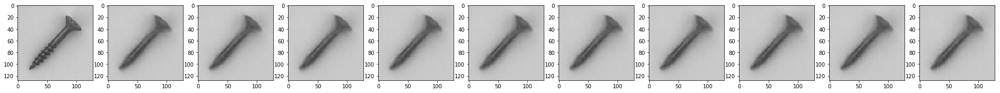

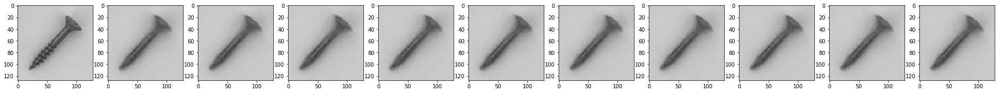

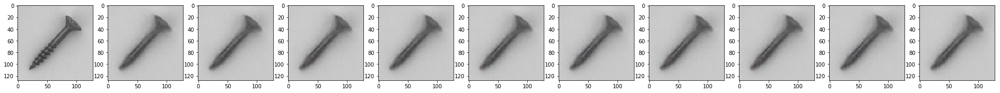

2700


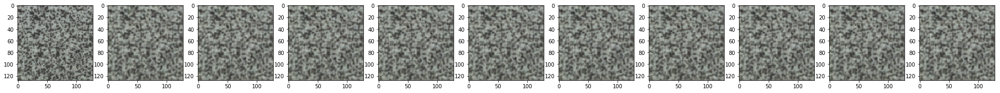

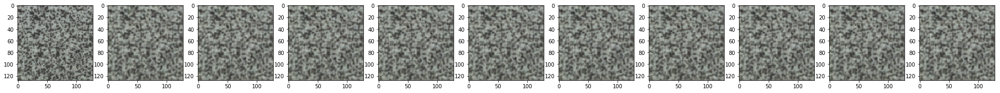

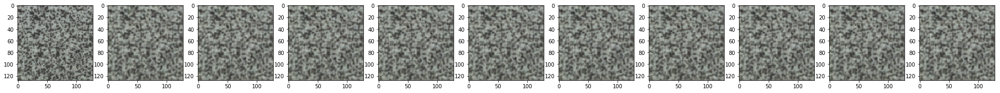

2800


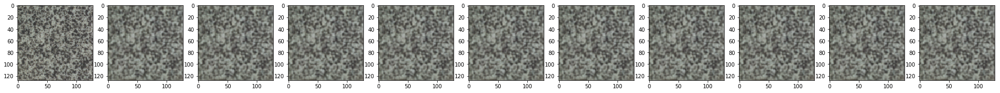

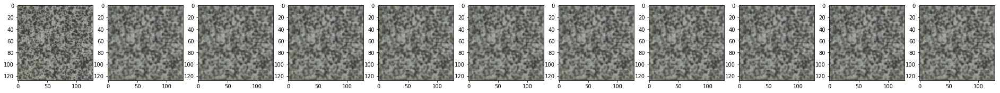

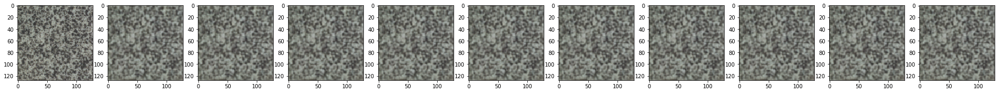

2900


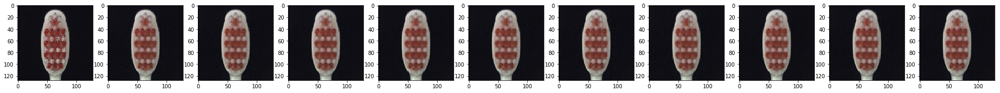

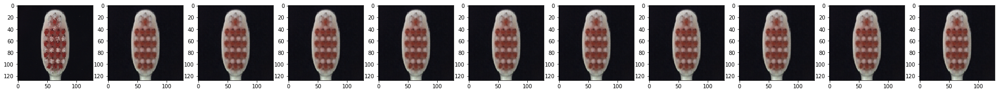

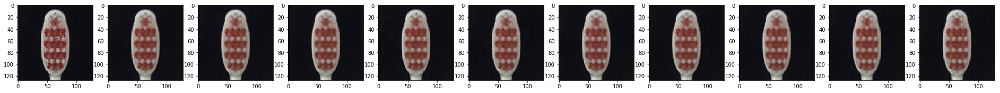

3000


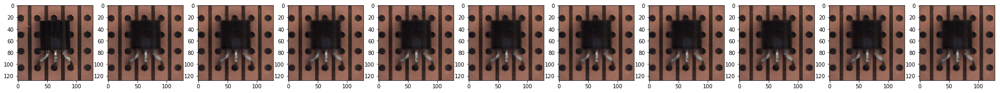

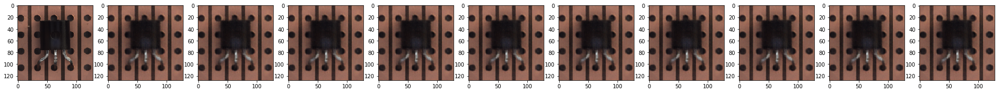

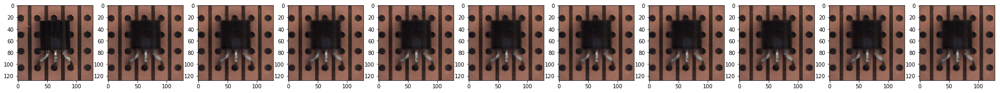

3100


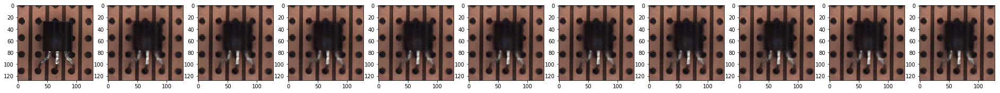

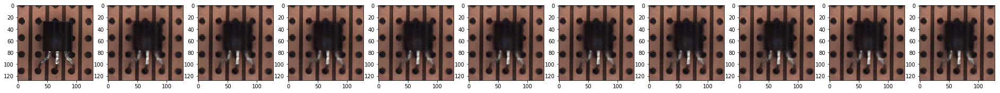

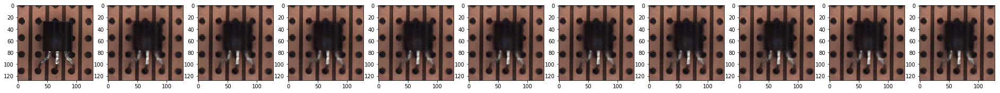

3200


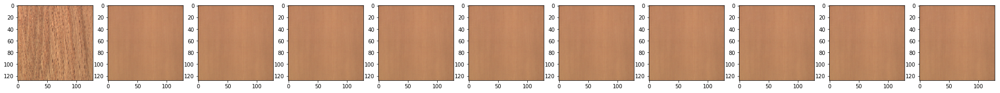

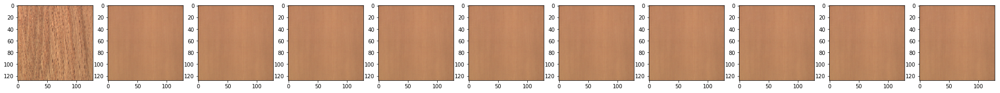

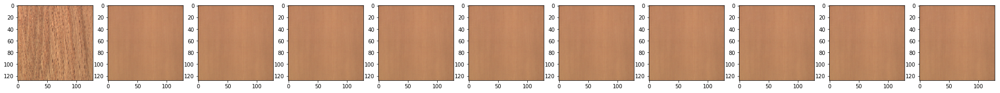

3300


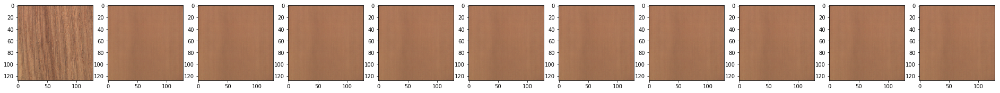

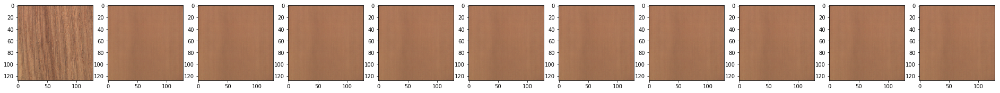

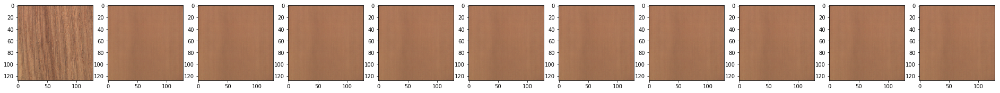

3400


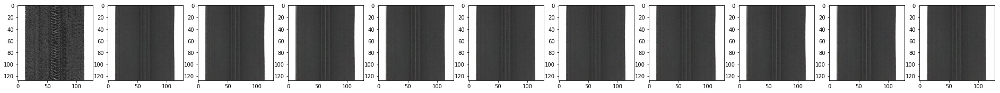

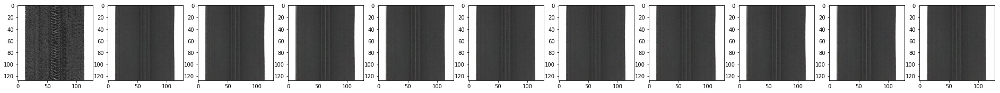

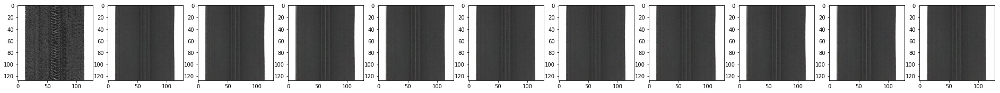

3500


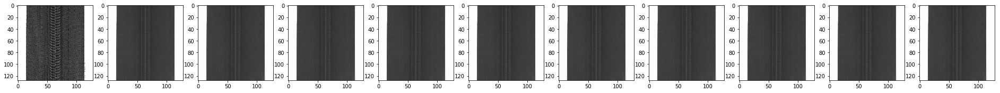

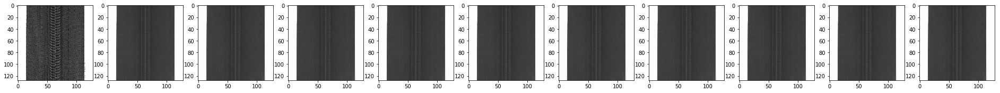

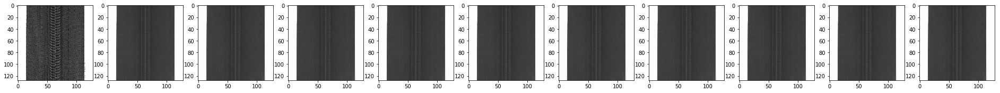

In [62]:

extralong = False

for i in range(36):
    ind = 100*i
    print(ind)
    
    previmg = other_dset[ind][0]
   
    imglist = [previmg]
    longimglist = [previmg]
    list1000 = [previmg]
    
  #  for j in range(10):
  #      imglist += [vec2img(img2vec(imglist[-1]))]
    for j in range(1000 if extralong else 100): # ten times the divergence!
        newimg = vec2img(img2vec(previmg))
        
        if j < 10:
            imglist += [newimg]
            
        if j%10==0 and j<100:
            longimglist += [newimg]
        
        if j%100==0 and extralong:
            list1000 += [newimg]
    
    show_imgs(*imglist)
    show_imgs(*longimglist)
    if extralong:
        show_imgs(*list1000)

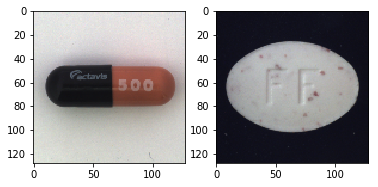

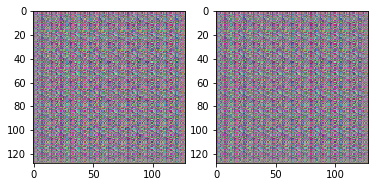

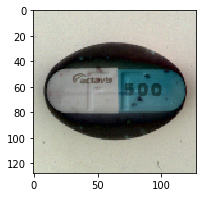

tensor(27742.0117)


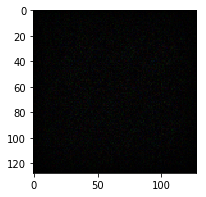

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor(889.3491, device='cuda:0')


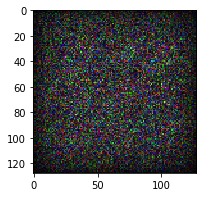

tensor(8893.4922, device='cuda:0')


In [79]:
vecA = img2vec(imgA)
vecB = img2vec(imgB)
rimgA = vec2img(vecA)
rimgB = vec2img(vecB)
show_imgs(imgA,imgB)
show_imgs(rimgA,rimgB)

imdif = abs(imgB-imgA)
show_imgs(imdif)
print(torch.sum(imdif))
rimdif = abs(rimgA-rimgB)
show_imgs(rimdif)
print(torch.sum(rimdif))
rimdif = 10*abs(rimgB-rimgA)
show_imgs(rimdif)
print(torch.sum(rimdif))

In [56]:
imgpuA = imgA.unsqueeze(0).to("cuda")
imgpuB = imgB.unsqueeze(0).to("cuda")
with torch.no_grad():
    zA = givenModel.module.encoder(imgpuA)
    zB = givenModel.module.encoder(imgpuB)


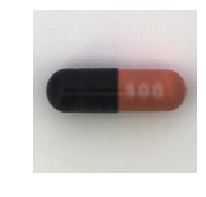

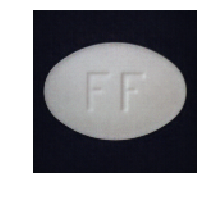

In [57]:
muA = zA[..., :100]
muB = zB[..., :100]
with torch.no_grad():
        rimgA = givenModel.module.decoder(muA.unsqueeze(-1).unsqueeze(-1))
        rimgB = givenModel.module.decoder(muB.unsqueeze(-1).unsqueeze(-1))
show_img_from_tensor(rimgA.squeeze(0))
show_img_from_tensor(rimgB.squeeze(0))

In [58]:
zs = []
for i in range(startStep,endStep):
    zs+=[zB + i*(zA-zB)/steps]

In [59]:
imgs = []
#    def reparameterize(self, mu, logvar):
#        std = (0.5 * logvar).exp()
#        eps = torch.randn_like(std)
#        return mu + eps * std
for j in range(startStep,endStep):
    i = j-startStep
    mu, logvar = zs[i][..., :100], zs[i][..., 100:]
    
    ############# make standard deviation zero, that is, use only mu in reparameterize
    logvar = torch.zeros_like(logvar)
    
    ### old way zrep = givenModel.module.reparameterize(mu, logvar).unsqueeze(-1).unsqueeze(-1)
    
    zrep = mu.unsqueeze(-1).unsqueeze(-1) # new way
    
    with torch.no_grad():
        imgs+= [givenModel.module.decoder(zrep)]

In [60]:
j=20
print(f"{modelName} B:{j/steps:.3f}")

f050 epo:480 B:1.000


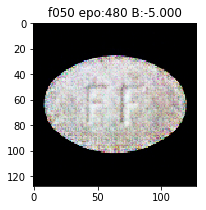

In [64]:

plt.rcParams["figure.figsize"] = (3,3)

frames = []
with torch.no_grad():
    for img in imgs:
        single_img = img.squeeze(0)
        single_img = single_img.permute(1,2,0).cpu().numpy()
        frames += [single_img]

def update(j):
    i = j-startStep
    #print(""+str(j/numInterpol)+"Blue "+str(1 - j/numInterpol)+"Orange:")
    plt.title(f"{modelName} B:{j/steps:.3f}")
    plt.imshow(frames[i])
    
#def update(i):
#    label = 'timestep {0}'.format(i)
#    print(label)
    # Update the line and the axes (with a new xlabel). Return a tuple of
    # "artists" that have to be redrawn for this frame.
#    line.set_ydata(x - 5 + i)
#    ax.set_xlabel(label)
#    return line, ax

#if __name__ == '__main__':
    # FuncAnimation will call the 'update' function for each frame; here
    # animating over 10 frames, with an interval of 200ms between frames.
from matplotlib.animation import FuncAnimation
import numpy as np
fig, ax = plt.subplots()
anim = FuncAnimation(fig, update, frames=np.arange(startStep, endStep), interval=50)
    #if len(sys.argv) > 1 and sys.argv[1] == 'save':
    #    anim.save('line.gif', dpi=80, writer='imagemagick')
    #else:
        # plt.show() will just loop the animation forever.
    #    plt.show()
#plt.show()

from IPython.display import HTML
HTML(anim.to_html5_video())



# Wait here, an video will show up above!

In [ ]:
sample_train_img, sample_train_target = train_dset[31]

In [ ]:
show_img_from_tensor(sample_train_img)

In [ ]:
for model in models:
    evaluate_and_show(model, sample_train_img.unsqueeze(0))